In [12]:
import time, os, glob

import pandas as pd
import numpy as np

# for ploting
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib  inline
plt.figure(figsize=(12,8))

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

In [2]:
df = pd.read_csv(r'dataset/resume.csv')
df.head()

,Category,Resume,cleaned_resume,Category_name
0,6,Skills * Programming Languages: Python (pandas...,Skills Programming Languages Python pandas num...,Data Science
1,6,Education Details \r\nMay 2013 to May 2017 B.E...,Education Details May 2013 to May 2017 B E UIT...,Data Science
2,6,"Areas of Interest Deep Learning, Control Syste...",Areas of Interest Deep Learning Control System...,Data Science
3,6,Skills â¢ R â¢ Python â¢ SAP HANA â¢ Table...,Skills R Python SAP HANA Tableau SAP HANA SQL ...,Data Science
4,6,"Education Details \r\n MCA YMCAUST, Faridab...",Education Details MCA YMCAUST Faridabad Haryan...,Data Science


In [3]:
df.shape

(962, 4)

In [28]:
Category, Count = list(df['Category_name'].value_counts().index), list(df['Category_name'].value_counts().values)
df2 = pd.DataFrame(data = list(zip(Category, Count)), columns=['Category', 'Count'])
df2

,Category,Count
0,Java Developer,84
1,Testing,70
2,DevOps Engineer,55
3,Python Developer,48
4,Web Designing,45
5,HR,44
6,Hadoop,42
7,Blockchain,40
8,ETL Developer,40
9,Operations Manager,40


In [11]:
# sns.countplot(x ='Category_name', data = df)
# # Show the plot
# plt.show()

In [10]:
px.histogram(df, x='Category_name', color="Category_name") # barmode='group'

In [34]:
fig = px.pie(df2, values='Count', names='Category', title='Category Count')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

In [38]:
# Use `hole` to create a donut-like pie chart
fig = go.Figure(data=[go.Pie(labels=df2['Category'], values=df2['Count'], hole=.4)])
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

In [2]:
df = pd.read_csv(r'dataset/data-final.csv', sep='\t')
df.head()

,EXT1,EXT2,EXT3,EXT4,EXT5,EXT6,EXT7,EXT8,EXT9,EXT10,...,dateload,screenw,screenh,introelapse,testelapse,endelapse,IPC,country,lat_appx_lots_of_err,long_appx_lots_of_err
0,4.0,1.0,5.0,2.0,5.0,1.0,5.0,2.0,4.0,1.0,...,2016-03-03 02:01:01,768.0,1024.0,9.0,234.0,6,1,GB,51.5448,0.1991
1,3.0,5.0,3.0,4.0,3.0,3.0,2.0,5.0,1.0,5.0,...,2016-03-03 02:01:20,1360.0,768.0,12.0,179.0,11,1,MY,3.1698,101.706
2,2.0,3.0,4.0,4.0,3.0,2.0,1.0,3.0,2.0,5.0,...,2016-03-03 02:01:56,1366.0,768.0,3.0,186.0,7,1,GB,54.9119,-1.3833
3,2.0,2.0,2.0,3.0,4.0,2.0,2.0,4.0,1.0,4.0,...,2016-03-03 02:02:02,1920.0,1200.0,186.0,219.0,7,1,GB,51.75,-1.25
4,3.0,3.0,3.0,3.0,5.0,3.0,3.0,5.0,3.0,4.0,...,2016-03-03 02:02:57,1366.0,768.0,8.0,315.0,17,2,KE,1.0,38.0


In [3]:
df.shape

(1015341, 110)

In [49]:
os.makedirs("dataset/data_final", exist_ok=True)
dfs = np.array_split(df, 50)
for data_index in range(len(dfs)):
    dfs[data_index].to_csv("dataset/data_final/data_final_"+str(data_index)+".csv", index=False)

In [6]:
Category, Count = list(df['country'].value_counts().index), list(df['country'].value_counts().values)
df2 = pd.DataFrame(data = list(zip(Category, Count)), columns=['Country', 'Count'])
df2

,Country,Count
0,US,546403
1,GB,66596
2,CA,61849
3,AU,50030
4,PH,19847
...,...,...
218,TD,1
219,KM,1
220,FK,1
221,MH,1


In [9]:
# Use `hole` to create a donut-like pie chart
fig = go.Figure(data=[go.Pie(labels=df2['Country'], values=df2['Count'], hole=.4)])
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

c:\users\kiran\appdata\local\programs\python\python38\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



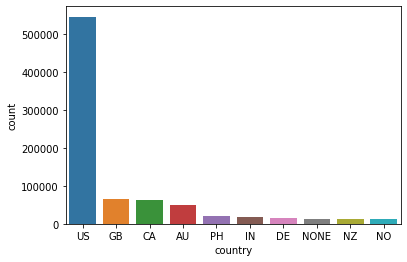

In [13]:
sns.countplot(df.country, order=df.country.value_counts().iloc[:10].index)
plt.show()

37


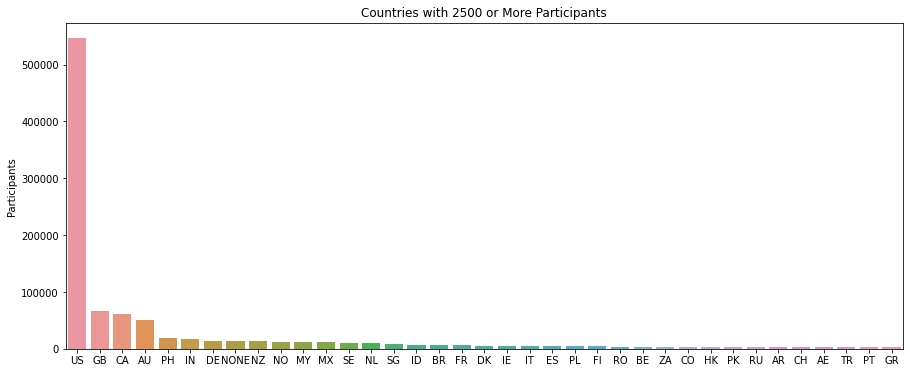

In [15]:
countries = pd.DataFrame(df['country'].value_counts())
countries_2500 = countries[countries['country'] >= 2500]
print(countries_2500.size)
plt.figure(figsize=(15,6))
sns.barplot(data=countries_2500, x=countries_2500.index, y='country')
plt.title('Countries with 2500 or More Participants')
plt.ylabel('Participants');

In [18]:
# !pip install yellowbrick

from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

In [21]:
df.drop(df.columns[50:110], axis=1, inplace=True)
df.shape

(1015341, 50)

In [22]:
df.describe()

,EXT1,EXT2,EXT3,EXT4,EXT5,EXT6,EXT7,EXT8,EXT9,EXT10,...,OPN1,OPN2,OPN3,OPN4,OPN5,OPN6,OPN7,OPN8,OPN9,OPN10
count,1.013558e+06,1.013558e+06,1.013558e+06,1.013558e+06,1.013558e+06,1.013558e+06,1.013558e+06,1.013558e+06,1.013558e+06,1.013558e+06,...,1.013558e+06,1.013558e+06,1.013558e+06,1.013558e+06,1.013558e+06,1.013558e+06,1.013558e+06,1.013558e+06,1.013558e+06,1.013558e+06
mean,2.648067e+00,2.773115e+00,3.288349e+00,3.140595e+00,3.276960e+00,2.401100e+00,2.771744e+00,3.414818e+00,2.963740e+00,3.556469e+00,...,3.654636e+00,2.075933e+00,4.000068e+00,1.999891e+00,3.792905e+00,1.894605e+00,3.976375e+00,3.182453e+00,4.122993e+00,3.958441e+00
std,1.264407e+00,1.323943e+00,1.215006e+00,1.237442e+00,1.277593e+00,1.225721e+00,1.400336e+00,1.271915e+00,1.346040e+00,1.305232e+00,...,1.157155e+00,1.112600e+00,1.097169e+00,1.090239e+00,9.923859e-01,1.104125e+00,1.008505e+00,1.255374e+00,1.041216e+00,1.034491e+00
min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,1.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,1.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,3.000000e+00,...,3.000000e+00,1.000000e+00,3.000000e+00,1.000000e+00,3.000000e+00,1.000000e+00,3.000000e+00,2.000000e+00,4.000000e+00,3.000000e+00
50%,3.000000e+00,3.000000e+00,3.000000e+00,3.000000e+00,3.000000e+00,2.000000e+00,3.000000e+00,4.000000e+00,3.000000e+00,4.000000e+00,...,4.000000e+00,2.000000e+00,4.000000e+00,2.000000e+00,4.000000e+00,2.000000e+00,4.000000e+00,3.000000e+00,4.000000e+00,4.000000e+00
75%,4.000000e+00,4.000000e+00,4.000000e+00,4.000000e+00,4.000000e+00,3.000000e+00,4.000000e+00,4.000000e+00,4.000000e+00,5.000000e+00,...,5.000000e+00,3.000000e+00,5.000000e+00,3.000000e+00,5.000000e+00,2.000000e+00,5.000000e+00,4.000000e+00,5.000000e+00,5.000000e+00
max,5.000000e+00,5.000000e+00,5.000000e+00,5.000000e+00,5.000000e+00,5.000000e+00,5.000000e+00,5.000000e+00,5.000000e+00,5.000000e+00,...,5.000000e+00,5.000000e+00,5.000000e+00,5.000000e+00,5.000000e+00,5.000000e+00,5.000000e+00,5.000000e+00,5.000000e+00,5.000000e+00


In [23]:
df = df[(df > 0).all(axis=1)]
df.describe()

,EXT1,EXT2,EXT3,EXT4,EXT5,EXT6,EXT7,EXT8,EXT9,EXT10,...,OPN1,OPN2,OPN3,OPN4,OPN5,OPN6,OPN7,OPN8,OPN9,OPN10
count,874434.000000,874434.000000,874434.000000,874434.000000,874434.000000,874434.000000,874434.000000,874434.000000,874434.000000,874434.000000,...,874434.000000,874434.00000,874434.000000,874434.000000,874434.000000,874434.000000,874434.000000,874434.000000,874434.000000,874434.000000
mean,2.645693,2.795889,3.298964,3.167806,3.297512,2.411223,2.780479,3.443987,2.979535,3.588282,...,3.703026,2.07053,4.035008,1.995491,3.824307,1.901202,4.022261,3.221340,4.166739,3.983939
std,1.250871,1.306720,1.188259,1.210432,1.239669,1.208842,1.380444,1.242385,1.325278,1.274354,...,1.100078,1.09506,1.040036,1.071258,0.933451,1.084797,0.935574,1.222737,0.971584,0.986196
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,2.000000,2.000000,2.000000,2.000000,2.000000,1.000000,2.000000,2.000000,2.000000,3.000000,...,3.000000,1.00000,3.000000,1.000000,3.000000,1.000000,4.000000,2.000000,4.000000,3.000000
50%,3.000000,3.000000,3.000000,3.000000,3.000000,2.000000,3.000000,4.000000,3.000000,4.000000,...,4.000000,2.00000,4.000000,2.000000,4.000000,2.000000,4.000000,3.000000,4.000000,4.000000
75%,4.000000,4.000000,4.000000,4.000000,4.000000,3.000000,4.000000,4.000000,4.000000,5.000000,...,5.000000,3.00000,5.000000,3.000000,5.000000,2.000000,5.000000,4.000000,5.000000,5.000000
max,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,...,5.000000,5.00000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


In [24]:
km = KMeans()
elbow = KElbowVisualizer(km, k=(2,10))

In [25]:
df_sample = df.sample(n=10000, random_state=1)

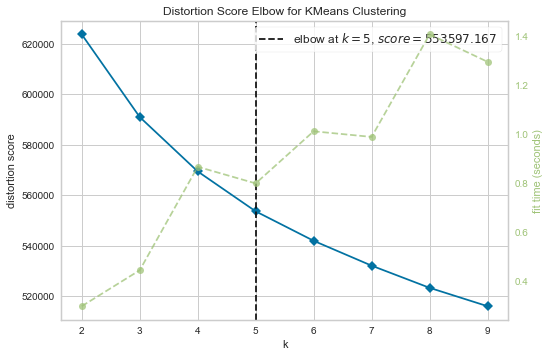

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [26]:
elbow.fit(df_sample)
elbow.poof()

In [27]:
kmeans = KMeans(n_clusters=5)
kfit = kmeans.fit(df)

In [28]:
predicoes = kfit.labels_
df['Clusters'] = predicoes

C:\Users\Kiran\AppData\Local\Temp\ipykernel_15696\1678622345.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [29]:
df

,EXT1,EXT2,EXT3,EXT4,EXT5,EXT6,EXT7,EXT8,EXT9,EXT10,...,OPN2,OPN3,OPN4,OPN5,OPN6,OPN7,OPN8,OPN9,OPN10,Clusters
0,4.0,1.0,5.0,2.0,5.0,1.0,5.0,2.0,4.0,1.0,...,1.0,4.0,1.0,4.0,1.0,5.0,3.0,4.0,5.0,4
1,3.0,5.0,3.0,4.0,3.0,3.0,2.0,5.0,1.0,5.0,...,2.0,4.0,2.0,3.0,1.0,4.0,2.0,5.0,3.0,3
2,2.0,3.0,4.0,4.0,3.0,2.0,1.0,3.0,2.0,5.0,...,1.0,2.0,1.0,4.0,2.0,5.0,3.0,4.0,4.0,3
3,2.0,2.0,2.0,3.0,4.0,2.0,2.0,4.0,1.0,4.0,...,2.0,5.0,2.0,3.0,1.0,4.0,4.0,3.0,3.0,0
4,3.0,3.0,3.0,3.0,5.0,3.0,3.0,5.0,3.0,4.0,...,1.0,5.0,1.0,5.0,1.0,5.0,3.0,5.0,5.0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1015336,4.0,2.0,4.0,3.0,4.0,3.0,3.0,3.0,3.0,3.0,...,2.0,4.0,3.0,4.0,2.0,4.0,2.0,2.0,4.0,2
1015337,4.0,3.0,4.0,3.0,3.0,3.0,4.0,4.0,3.0,3.0,...,1.0,5.0,1.0,5.0,1.0,3.0,4.0,5.0,4.0,2
1015338,4.0,2.0,4.0,3.0,5.0,1.0,4.0,2.0,4.0,4.0,...,1.0,5.0,1.0,4.0,1.0,5.0,5.0,4.0,5.0,2
1015339,2.0,4.0,3.0,4.0,2.0,2.0,1.0,4.0,2.0,4.0,...,2.0,4.0,2.0,3.0,2.0,4.0,5.0,5.0,3.0,3


In [30]:
df['Clusters'].value_counts()

2    193642
4    182336
3    181966
1    170774
0    145716
Name: Clusters, dtype: int64

In [31]:
Category, Count = list(df['Clusters'].value_counts().index), list(df['Clusters'].value_counts().values)
df2 = pd.DataFrame(data = list(zip(Category, Count)), columns=['Clusters', 'Count'])
df2

,Clusters,Count
0,2,193642
1,4,182336
2,3,181966
3,1,170774
4,0,145716


In [32]:
px.histogram(df, x='Clusters', color="Clusters")

In [ ]:
# https://www.kaggle.com/code/ishitaa25/soc471
# https://www.kaggle.com/code/sevvalkalkan/personality
# https://www.kaggle.com/code/yadhua/eda-and-cluster-analysis

In [ ]:
Python Program For Converting Roman Numerals To Decimal
Input: IX
Output: 9
IX is a Roman symbol which represents 9 